## Connect to kaggle

In [1]:
!pip install --user kaggle
!mkdir /root/.kaggle

In [2]:
!mv /content/kaggle.json /root/.kaggle/kaggle.json

In [3]:
!kaggle competitions download -c commonlitreadabilityprize

  0% 0.00/108 [00:00<?, ?B/s]
100% 108/108 [00:00<00:00, 96.5kB/s]
  0% 0.00/1.13M [00:00<?, ?B/s]
100% 1.13M/1.13M [00:00<00:00, 77.2MB/s]
  0% 0.00/6.79k [00:00<?, ?B/s]
100% 6.79k/6.79k [00:00<00:00, 6.54MB/s]


In [4]:
!ls

sample_data  sample_submission.csv  test.csv  train.csv.zip


In [5]:
import os

for filename in os.listdir('.'):
    if filename.endswith('.zip'):
        os.system("unzip {}".format(filename))
        os.system("rm {}".format(filename))

## Visualization with Bokeh

In [ ]:
!pip install --upgrade pip
!pip install --upgrade numpy
!pip install --upgrade sentence_transformers
!conda install -c conda-forge hdbscan --y
!pip install bokeh
!pip install --upgrade bertopic[visualization]

In [2]:
# !pip uninstall numpy
# !pip install numpy

In [8]:
from bertopic import BERTopic
import pandas as pd
from sentence_transformers import SentenceTransformer
import sklearn.manifold
import umap
import numpy as np
import pandas as pd
import random
from nltk.corpus import stopwords

random.seed(42)

from bokeh.io import output_file, show
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper
from bokeh.palettes import plasma, d3, Turbo256
from bokeh.plotting import figure
from bokeh.transform import transform
import bokeh.io
bokeh.io.output_notebook()

import bokeh.plotting as bpl
import bokeh.models as bmo
bpl.output_notebook()

读取数据

In [4]:
test = pd.read_csv('test.csv')
train = pd.read_csv('train.csv')

train['set'] = 'train'
test['set'] = 'test'

combined = pd.concat([train, test], ignore_index=True)
combined.target.fillna(3, inplace=True)

texts = combined.excerpt.values.tolist()
targets = combined.target.values.tolist()
sets = combined.set.values.tolist()

文本处理（可选）

In [9]:
# def preprocess_tweet_data(data,name):
#     # Lowering the case of the words in the sentences
#     data[name]=data[name].str.lower()
#     # Code to remove the Hashtags from the text
#     data[name]=data[name].apply(lambda x:re.sub(r'\B#\S+','',x))
#     # Code to remove the links from the text
#     data[name]=data[name].apply(lambda x:re.sub(r"http\S+", "", x))
#     # Code to remove the Special characters from the text 
#     data[name]=data[name].apply(lambda x:' '.join(re.findall(r'\w+', x)))
#     # Code to substitute the multiple spaces with single spaces
#     data[name]=data[name].apply(lambda x:re.sub(r'\s+', ' ', x, flags=re.I))
#     # Code to remove all the single characters in the text
#     data[name]=data[name].apply(lambda x:re.sub(r'\s+[a-zA-Z]\s+', '', x))
#     # Remove the twitter handlers
#     data[name]=data[name].apply(lambda x:re.sub('@[^\s]+','',x))


def preprocess(data):
    excerpt_processed=[]
    for e in data['excerpt']:
        # find alphabets
        e = re.sub("[^a-zA-Z]", " ", e)
        e = re.sub(r'\s+', ' ', e, flags=re.I)

        # # convert to lower case
        # e = e.lower()
        
        # tokenize words
        e = nltk.word_tokenize(e)
        # remove stopwords
        e = [word for word in e if not word.lower() in set(stopwords.words("english"))]
        # lemmatization
        lemma = nltk.WordNetLemmatizer()
        e = [lemma.lemmatize(word) for word in e]
        e=" ".join(e)
        
        excerpt_processed.append(e)
        
    return excerpt_processed 

使用sentence bert计算文档向量

In [5]:
model = SentenceTransformer('stsb-distilbert-base')

In [6]:
embeddings = model.encode(texts)

### 降维 t-SNE 与 umap

- t-SNE保留数据中局部结构。
- UMAP保留数据中的本地和大部分全局结构。
- UMAP比tSNE要快得多，当面对更多数据、更高维数据时

In [11]:
color_mapper = LinearColorMapper(palette='Plasma256', low=min(targets), high=max(targets))

In [10]:
out = sklearn.manifold.TSNE(n_components=2).fit_transform(embeddings)

绘制Boken。test set标签设置为3。

In [12]:
SETS = ['train', 'test']
MARKERS = ['circle', 'triangle']

list_x = out[:,0]
list_y = out[:,1]
desc = texts

source = ColumnDataSource(data=dict(x=list_x, y=list_y, desc=desc, targets=targets, dset=sets))
hover = HoverTool(tooltips=[
    ("index", "$index"),
    ("(x,y)", "(@x, @y)"),
    ('desc', '@desc'),
    ('targets', '@targets'),
    ('dset', '@dset')
])

p = figure(plot_width=800, plot_height=800, tools=[hover], title="First Look at the Data")
p.scatter('x', 'y', size=10, source=source, legend='dset', color={'field': 'targets', 'transform': color_mapper},
         marker=bokeh.transform.factor_mark('dset', MARKERS, SETS),)

bpl.show(p)

In [ ]:
umap_model = umap.UMAP(n_neighbors=15, n_components=2, metric='cosine')
out_umap = umap_model.fit_transform(embeddings)

In [76]:
SETS = ['train', 'test']
MARKERS = ['circle', 'triangle']

list_x = out_umap[:,0]
list_y = out_umap[:,1]
desc = texts

source = ColumnDataSource(data=dict(x=list_x, y=list_y, desc=desc, targets=targets, dset=sets))
hover = HoverTool(tooltips=[
    ("index", "$index"),
    ("(x,y)", "(@x, @y)"),
    ('desc', '@desc'),
    ('targets', '@targets'),
    ('dset', '@dset')
])

p = figure(plot_width=800, plot_height=800, tools=[hover], title="First Look at the Data")
p.scatter('x', 'y', size=10, source=source, legend='dset', color={'field': 'targets', 'transform': color_mapper},
         marker=bokeh.transform.factor_mark('dset', MARKERS, SETS),)

bpl.show(p)

/usr/local/lib/python3.7/dist-packages/bokeh/util/deprecation.py:75: BokehDeprecationWarning:

'legend' keyword is deprecated, use explicit 'legend_label', 'legend_field', or 'legend_group' keywords instead



### Kmeans 观察数据

In [33]:
from sklearn.decomposition import PCA
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [26]:
def find_optimal_clusters(data, max_k):
    iters = range(2, max_k+1, 1)
    
    sse = []  # 轮廓系数
    for k in iters:
        cluster = MiniBatchKMeans(n_clusters=k, init_size=256, batch_size=512, random_state=20).fit(data)
        silhouette_avg = silhouette_score(data, cluster.labels_)
        sse.append(silhouette_avg)
        print('Fit {} clusters'.format(k))
        
    f, ax = plt.subplots(1, 1)
    ax.plot(iters, sse, marker='o')
    ax.set_xlabel('Cluster Centers')
    ax.set_xticks(iters)
    ax.set_xticklabels(iters)
    ax.set_ylabel('SSE')
    ax.set_title('SSE by Cluster Center Plot')

Fit 2 clusters
Fit 3 clusters
Fit 4 clusters
Fit 5 clusters
Fit 6 clusters
Fit 7 clusters
Fit 8 clusters
Fit 9 clusters
Fit 10 clusters
Fit 11 clusters
Fit 12 clusters
Fit 13 clusters
Fit 14 clusters
Fit 15 clusters
Fit 16 clusters
Fit 17 clusters
Fit 18 clusters
Fit 19 clusters
Fit 20 clusters


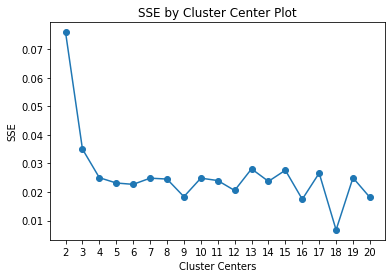

In [27]:
find_optimal_clusters(embeddings, 20)

In [29]:
clusters_2 = MiniBatchKMeans(n_clusters=2, init_size=256, batch_size=512, random_state=20).fit_predict(embeddings)

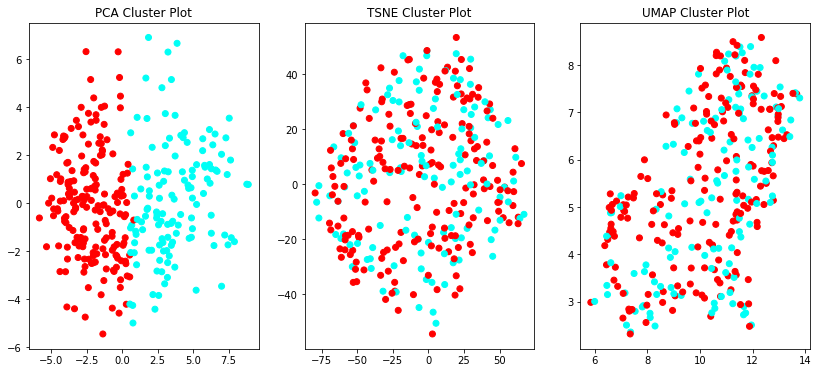

In [34]:
def plot_tsne_pca_umap(data, labels):
    max_label = max(labels)+1
    max_items = np.random.choice(range(data.shape[0]), size=2700, replace=False)
    
    # reducer = umap.UMAP(n_components=2)
    pca = PCA(n_components=2).fit_transform(data[max_items,:])
    tsne = sklearn.manifold.TSNE(n_components=2).fit_transform(embeddings)
    uma = umap.UMAP(n_components=2).fit_transform(embeddings)
    
    
    idx = np.random.choice(range(pca.shape[0]), size=320, replace=False)
    label_subset = labels[max_items]
    label_subset = [cm.hsv(i/max_label) for i in label_subset[idx]]
    
    f, ax = plt.subplots(1, 3, figsize=(14, 6))
    
    ax[0].scatter(pca[idx, 0], pca[idx, 1], c=label_subset)
    ax[0].set_title('PCA Cluster Plot')
    
    ax[1].scatter(tsne[idx, 0], tsne[idx, 1], c=label_subset)
    ax[1].set_title('TSNE Cluster Plot')
    
    ax[2].scatter(uma[idx,0],uma[idx,1],c=label_subset)
    ax[2].set_title('UMAP Cluster Plot')
    
plot_tsne_pca_umap(embeddings, clusters_2)

## Topic

### BERT topic


BERTopic依赖于句子嵌入和聚类算法，以及降维，生成文档主题簇。

In [35]:
model = BERTopic(language="english", min_topic_size=20)
topics, probs = model.fit_transform(texts)

In [39]:
topic_words = ['-1: outlier']
for i in range(len(set(topics))-1):
  tpc = model.get_topic(i)[:8]
  words = [x[0] for x in tpc]
  tw = ' '.join([str(i) + ':'] + words)
  topic_words.append(tw)

exp_topics = [topic_words[x+1] for x in topics]

In [45]:
len(set(topics))

18

In [41]:
clrs = random.sample(Turbo256, len(set(topics)))
color_map = bmo.CategoricalColorMapper(factors=topic_words, palette=clrs)

list_x = out[:,0]
list_y = out[:,1]
desc = texts

source = ColumnDataSource(data=dict(x=list_x, y=list_y, desc=desc, topic=exp_topics, target=targets, dset=sets,))
hover = HoverTool(tooltips=[
    ("index", "$index"),
    ('desc', '@desc'),
    ('topic', '@topic'),
    ('target', '@target'),
    ('dset', '@dset'),
])

p = figure(plot_width=800, plot_height=800, tools=[hover], title="Topics from BERTopic model")
p.scatter('x', 'y', size=10, source=source,
         fill_color=transform('topic', color_map),
         marker=bokeh.transform.factor_mark('dset', MARKERS, SETS),
         legend='dset'
)
# p.legend.location = "top_left"
# p.legend.click_policy="hide"

bokeh.plotting.show(p)

In [46]:
topic_df = model.get_topic_freq()

def get_keywords(i):
    if i == -1: return 'outlier'
    tpc = model.get_topic(i)[:8]
    words = [x[0] for x in tpc]
    tw = ' '.join(words)
    return tw

topic_df['keywords'] = topic_df['Topic'].apply(get_keywords)

topic_df

,Topic,Count,keywords
0,-1,1122,outlier
1,0,266,was of were had with as they we
2,1,258,of war government states was were have are
3,2,202,she her had with but little not on
4,3,194,is of in be are to with at
5,4,161,he said they his him hyena hare she
6,5,92,he his was had him by would himself
7,6,81,computer data software system internet sound c...
8,7,76,species plants food animals fish these organis...
9,8,73,he his was him had tom but said


In [51]:
model.get_topic(0)

[('was', 0.024936852640794673),
 ('of', 0.020002631742769342),
 ('were', 0.018931159771191714),
 ('had', 0.018178649108211924),
 ('with', 0.01697595261967379),
 ('as', 0.015020058576091126),
 ('they', 0.013985910427025055),
 ('we', 0.01300431540086258),
 ('their', 0.01149088646789199),
 ('its', 0.009871328627834214)]

In [52]:
model.visualize_topics()

In [55]:
# model.visualize_distribution(probs)

### Classic LDA

In [60]:
import os

In [56]:
!pip install -Uqq gensim==3.8.3

     |████████████████████████████████| 24.2 MB 100 kB/s 


In [57]:
# import os       #importing os to set environment variable
# def install_java():
#   !apt-get install -y openjdk-8-jdk-headless -qq > /dev/null      #install openjdk
#   os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"     #set environment variable
#   !java -version       #check java version
# install_java()

In [58]:
!wget -q http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
!unzip -qq mallet-2.0.8.zip

In [61]:
os.environ['MALLET_HOME'] = '/content/mallet-2.0.8'
mallet_path = '/content/mallet-2.0.8/bin/mallet' # you should NOT need to change this 

In [63]:
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models.wrappers import LdaMallet
from gensim.models.coherencemodel import CoherenceModel
from gensim import similarities

import os.path
import re
import glob

import nltk
nltk.download('stopwords')

from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [62]:
def preprocess_data(doc_set,extra_stopwords = {}):
    # adapted from https://www.datacamp.com/community/tutorials/discovering-hidden-topics-python
    # replace all newlines or multiple sequences of spaces with a standard space
    doc_set = [re.sub('\s+', ' ', doc) for doc in doc_set]
    # initialize regex tokenizer
    tokenizer = RegexpTokenizer(r'\w+')
    # create English stop words list
    en_stop = set(stopwords.words('english'))
    # add any extra stopwords
    if (len(extra_stopwords) > 0):
        en_stop = en_stop.union(extra_stopwords)
    
    # list for tokenized documents in loop
    texts = []
    # loop through document list
    for i in doc_set:
        # clean and tokenize document string
        raw = i.lower()
        tokens = tokenizer.tokenize(raw)
        # remove stop words from tokens
        stopped_tokens = [i for i in tokens if not i in en_stop]
        # add tokens to list
        texts.append(stopped_tokens)
    return texts

def prepare_corpus(doc_clean):
    # adapted from https://www.datacamp.com/community/tutorials/discovering-hidden-topics-python
    # Creating the term dictionary of our courpus, where every unique term is assigned an index. dictionary = corpora.Dictionary(doc_clean)
    dictionary = corpora.Dictionary(doc_clean)
    
    dictionary.filter_extremes(no_below=5, no_above=0.5)
    # Converting list of documents (corpus) into Document Term Matrix using dictionary prepared above.
    doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]
    # generate LDA model
    return dictionary,doc_term_matrix

In [64]:
doc_clean = preprocess_data(texts,{})
dictionary, doc_term_matrix = prepare_corpus(doc_clean)

In [65]:
number_of_topics=30 # adjust this to alter the number of topics
words=10 #adjust this to alter the number of words output for the topic below

In [66]:
ldamallet = LdaMallet(mallet_path, corpus=doc_term_matrix, num_topics=number_of_topics, id2word=dictionary, alpha=10)

In [67]:
# topic_words = ldamallet.show_topics(num_topics=number_of_topics,num_words=5)
# topic_words = [x[1] for x in topic_words]

topic_words = []
for i in range(number_of_topics):
  tpc = ldamallet.show_topic(i, topn=7, num_words=None)
  words = [x[0] for x in tpc]
  tw = ' '.join([str(i) + ':'] + words)
  topic_words.append(tw)

In [68]:
topic_words

['0: people important person study things ways make',
 '1: asked tree back day eat hyena woman',
 '2: power current means electric machine electricity weight',
 '3: north south made country west years miles',
 '4: good boy boys jack girls lady make',
 '5: animals food species plants living fish plant',
 '6: ran time sleep run began thought bear',
 '7: life world men heart human man nature',
 '8: day fire night sun wind cold long',
 '9: man men horse boat side ship captain',
 '10: make sound work made time word words',
 '11: time money people street place road car',
 '12: 000 years 1 year 2 number 3',
 '13: water sea river ocean ice lake rock',
 '14: feet half large long side iron sides',
 '15: brain cells body called blood cell bacteria',
 '16: mother dog children baby house day cat',
 '17: great mr good found tom place day',
 '18: general case state public order question dr',
 '19: hair head face eyes long made black',
 '20: made time work great found business mr',
 '21: earth light s

In [70]:
# show result
topics_docs = list()
for m in ldamallet[doc_term_matrix[:1000]]:
    topics_docs.append(m)

x = np.array(topics_docs[:1000])
y = np.delete(x,0,axis=2)
y = y.squeeze()

best_topics = np.argmax(y, axis=1)  # 结果是一个分布
topics = list(best_topics)
topics = [topic_words[x] for x in topics]

In [71]:
clrs = random.sample(Turbo256, number_of_topics)
color_map = bmo.CategoricalColorMapper(factors=topic_words, palette=clrs)

list_x = out[:,0]
list_y = out[:,1]
desc = texts

source = ColumnDataSource(data=dict(x=list_x, y=list_y, desc=desc, topic=topics))
hover = HoverTool(tooltips=[
    ("index", "$index"),
    ('desc', '@desc'),
    ('topic', '@topic')
])

p = figure(plot_width=1200, plot_height=600, tools=[hover], title="Test")
p.circle('x', 'y', size=10, source=source,
         fill_color=transform('topic', color_map),
         # legend='topic'
)
# p.legend.location = "top_left"
# p.legend.click_policy="hide"

bpl.show(p)

/usr/local/lib/python3.7/dist-packages/bokeh/models/sources.py:179: BokehUserWarning:

ColumnDataSource's columns must be of the same length. Current lengths: ('desc', 2841), ('topic', 1000), ('x', 2841), ('y', 2841)



看上面的图表，由LDA重新识别的主题内文档不一定接近。 与BERTopic是互补的，可以得到不同的主题表示。

Bertopic在短文本这类可能只有一个主题的文本中表现较好，而LDA可以更好地处理主题组合较多的文本。 两者可以互补，因此尝试两者都有意义。

这和两者的原理是相关的，Bertopic是空间距离的聚类，LDA是统计层面的共现规律分析。

In [ ]:
# pyLDAvis可视化
!pip install -Uqq pyLDAvis==2.1.2

In [73]:
gensimmodel = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(ldamallet)

In [74]:
import pyLDAvis
import pyLDAvis.gensim

pyLDAvis.enable_notebook()
p = pyLDAvis.gensim.prepare(gensimmodel, doc_term_matrix, dictionary)
p

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working

/usr/local/lib/python3.7/dist-packages/past/builtins/misc.py:4: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:223: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:240: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:241: RuntimeWarning:

divide by zero encountered in log



PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
23    -0.162488 -0.141928       1        1  4.052566
1     -0.184561  0.045850       2        1  3.867514
6     -0.187024 -0.047104       3        1  3.856494
24     0.112509  0.099126       4        1  3.851594
4     -0.176534  0.073860       5        1  3.745710
0      0.107928  0.156159       6        1  3.604753
16    -0.171514  0.101232       7        1  3.560857
8     -0.100182 -0.174760       8        1  3.550382
22    -0.074056 -0.194868       9        1  3.544929
27    -0.162050  0.140285      10        1  3.528484
7      0.019088  0.077963      11        1  3.518181
15     0.198649  0.027735      12        1  3.395201
29     0.178397 -0.140789      13        1  3.388689
14     0.027563 -0.217555      14        1  3.293341
17    -0.107723  0.072724      15        1  3.292600
2      0.164062 -0.026768      16        1  3.241297
5      0.115446  0.035353      17        1  3.225796
18     0.074883  0.050891      18        1  3.222437
19    -0.120219 -0.153319      19        1  3.212409
28     0.214616  0.023977      20        1  3.178255
13     0.077993 -0.188811      21        1  3.111841
25     0.157748  0.116204      22        1  3.097849
26    -0.098518  0.198682      23        1  3.089256
11    -0.114043  0.026504      24        1  3.055241
20     0.062785  0.064718      25        1  3.030774
9     -0.110961 -0.053606      26        1  3.021126
10    -0.054918  0.066891      27        1  2.965593
3      0.039470  0.056354      28        1  2.906059
12     0.110399 -0.011148      29        1  2.879329
21     0.163257 -0.083851      30        1  2.711444, topic_info=           Term        Freq        Total Category  logprob  loglift
222       water  836.000000   836.000000  Default  30.0000  30.0000
40       people  965.000000   965.000000  Default  29.0000  29.0000
94       mother  509.000000   509.000000  Default  28.0000  28.0000
376         man  706.000000   706.000000  Default  27.0000  27.0000
330        king  358.000000   358.000000  Default  26.0000  26.0000
...         ...         ...          ...      ...      ...      ...
3673     system   47.971466   261.184532  Topic30  -4.7868   1.9131
634        dark   44.184245   208.965081  Topic30  -4.8691   2.0539
114        time   53.021094  1206.982877  Topic30  -4.6868   0.4825
1090    surface   39.134617   172.210332  Topic30  -4.9904   2.1260
973   direction   35.347396   114.522231  Topic30  -5.0922   2.4321

[2398 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
4249     29  0.988912      0
3063     29  0.998560    000
3920     29  0.997511      1
3921     12  0.012374     10
3921     13  0.012374     10
...     ...       ...    ...
64       10  0.201204  young
64       15  0.092660  young
64       17  0.026474  young
64       23  0.381228  young
4603     16  1.011599   zinc

[3993 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[24, 2, 7, 25, 5, 1, 17, 9, 23, 28, 8, 16, 30, 15, 18, 3, 6, 19, 20, 29, 14, 26, 27, 12, 21, 10, 11, 4, 13, 22])

ref: https://skok.ai/2021/05/27/Topic-Models-Introduction.html

### BERTopic 详解

[BERTopic](https://github.com/MaartenGr/BERTopic)，利用BERT嵌入和c-TF-IDF来创建密集的集群，使话题易于解释，同时在话题描述中保留重要词汇。其核心步骤主要是做三件事：
- 用基于BERT的Sentence Transformers提取语句嵌入
- 通过UMAP和HDBSCAN，将文档嵌入进行聚类，语义相近的语句将聚集成簇群
- 用c-TF-IDF提取主题词

c-TF-IDF就是将一个主题下的所有文档连接在一起成为一个文档，在主题间计算TF-IDF的方法。

In [77]:
import numpy as np
import pandas as pd
import jieba
import umap
import hdbscan
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from tqdm import tqdm
import matplotlib.pyplot as plt

# import sys
# sys.setrecursionlimit(1000000)

In [ ]:
# model = SentenceTransformer(r'my_pretrained_chinese_embeddings')
# embeddings = model.encode(data['review'].tolist(), show_progress_bar=True)

#### 降维
umap_embeddings = umap.UMAP(
      n_neighbors=25,
      n_components=10,
      min_dist=0.00,
      metric='cosine',
      random_state=2020).fit_transform(embeddings)


#### 聚类
# 使用HDBSCAN来寻找高密簇
cluster = hdbscan.HDBSCAN(
      min_cluster_size=30,
      metric='euclidean',
      cluster_selection_method='eom', 
      prediction_data=True).fit(umap_embeddings)


#### c-TF-IDF
def c_tf_idf(documents, m, ngram_range=(1, 1)):
  my_stopwords =  [i.strip() for i in open('stop_words_zh.txt',encoding='utf-8').readlines()]

  count = CountVectorizer(
      ngram_range=ngram_range,                             
      stop_words= my_stopwords).fit(documents)

  t = count.transform(documents).toarray()

  w = t.sum(axis=1)
  tf = np.divide(t.T, w)
  
  sum_t = t.sum(axis=0)
  idf = np.log(np.divide(m, sum_t)).reshape(-1, 1)
  
  tf_idf = np.multiply(tf, idf)
  
  return tf_idf, count


####  主题归并
# 通过比较主题之间的c-TF-IDF向量，合并最相似的向量，最后重新计算c-TF-IDF向量来更新主题的表示
